### Вычисление параметров отраженной волны 

##### Иморт у всех!

In [1]:
# %%px --local
# %reset
import sys

sys.path.append('E:\\PB11')
sys.path.append('D:\\PB11')

import importlib

import Invariants.Tube
import OneVelocity
from scipy import interpolate

importlib.reload(OneVelocity)
importlib.reload(Invariants.Tube)

from math import *
import sys
import time
import random as rnd

from Invariants.Tube import Tube

from Invariants.Plot import *
from OneVelocity.OvInit import ov_create_layer
from ElasticPiston.ElPistInit import el_pist_create_layer

import numpy as np

from ElasticPiston.ElPistInit import el_pist_create_layer

### Хромосома

In [2]:
from opti.GenerationP import GenerationP
from opti.ExecParallel import *

from task_for_engines import *

from opti.OptiPerson import OptiPerson
from opti.Chromosome import ChromoController, DRange, SRange

from rx.concurrency import CurrentThreadScheduler
from tqdm import tqdm_notebook, tqdm

from functional import seq
import matplotlib as mpl
%matplotlib inline 
%config InlineBackend.figure_format = 'svg' 

mpl.rcParams['figure.figsize'] = (7,5) 

om_1 = DRange(0.04, 0.15, 'om_1')
om_2 = DRange(0.01, 0.1, 'omega_piston')
m_1 = DRange(0.02, 0.15, 'm_1')
pf_1 = DRange(1E5, 100E5, 'pf_1')
delta_powder_1 = DRange(500, 950, 'delta_powder_1')
powder_types = [
    '4\\7',
    '6\\7 гр',
    '6\\7 фл ']

powder_type_1 = SRange(powder_types, 'powder_type_1')

cc = ChromoController([om_1,om_2,m_1,pf_1,delta_powder_1,powder_type_1])

n_max = 700
gp = GenerationP(cc, n_max)
gp.fit_threshold = 1300
gp.prob_cross = 0.5
gp.prob_mut =0.9
gp.prob_mut_gene = 0.2

In [3]:
cc.get_chromo()

{'om_1': 0.10443453479775505,
 'omega_piston': 0.043308180542957694,
 'm_1': 0.10490793467654397,
 'pf_1': 1072753.225491745,
 'delta_powder_1': 770.4691887827003,
 'powder_type_1': '6\\7 фл '}

#### Всякие вспомогательные функции

#### *Пороха*

In [4]:
# %%px --local
powders_dict = {
    '4\\7': {
        'name': '4\\7',
        'f': 1.027,
        'etta': 0.228,
        'alpha_k': 1.008,
        'T_1': 3006.0,
        'ro': 1.6,
        'I_k': 0.32,
        'Z_k': 1.488,
        'k_1': 0.811,
        'lambda_1': 0.081,
        'k_2': 0.505,
        'lambda_2': -1.024,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '4\\7 св': {
        'name': '4\\7 св',
        'f': 1.018,
        'etta': 0.229,
        'alpha_k': 1.014,
        'T_1': 2956.0,
        'ro': 1.6,
        'I_k': 0.33,
        'Z_k': 1.488,
        'k_1': 0.811,
        'lambda_1': 0.081,
        'k_2': 0.505,
        'lambda_2': -1.024,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '4\\7 фл ВБП': {
        'name': '4\\7 фл ВБП',
        'f': 0.915,
        'etta': 0.254,
        'alpha_k': 1.059,
        'T_1': 2410.0,
        'ro': 1.6,
        'I_k': 0.38,
        'Z_k': 1.556,
        'k_1': 0.478,
        'lambda_1': 0.711,
        'k_2': 0.65,
        'lambda_2': -0.893,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '4\\7 ПТ-3 фл': {
        'name': '4\\7 ПТ-3 фл',
        'f': 0.988,
        'etta': 0.237,
        'alpha_k': 1.038,
        'T_1': 2790.0,
        'ro': 1.6,
        'I_k': 0.28,
        'Z_k': 1.671,
        'k_1': 0.163,
        'lambda_1': 3.84,
        'k_2': 0.6,
        'lambda_2': -0.706,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '4\\7 Ц гр': {
        'name': '4\\7 Ц гр',
        'f': 0.988,
        'etta': 0.24,
        'alpha_k': 1.053,
        'T_1': 2736.0,
        'ro': 1.6,
        'I_k': 0.3,
        'Z_k': 1.602,
        'k_1': 0.653,
        'lambda_1': 0.247,
        'k_2': 0.65,
        'lambda_2': -0.791,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '6\\7 гр': {
        'name': '6\\7 гр',
        'f': 1.015,
        'etta': 0.231,
        'alpha_k': 1.02,
        'T_1': 2923.0,
        'ro': 1.6,
        'I_k': 0.5,
        'Z_k': 1.498,
        'k_1': 0.794,
        'lambda_1': 0.098,
        'k_2': 0.513,
        'lambda_2': -1.004,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '6\\7 БП гр': {
        'name': '6\\7 БП гр',
        'f': 0.96,
        'etta': 0.245,
        'alpha_k': 1.069,
        'T_1': 2620.0,
        'ro': 1.6,
        'I_k': 0.56,
        'Z_k': 1.461,
        'k_1': 0.759,
        'lambda_1': 0.156,
        'k_2': 0.539,
        'lambda_2': -1.084,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '6\\7 фл В БП': {
        'name': '6\\7 фл В БП',
        'f': 0.98,
        'etta': 0.241,
        'alpha_k': 1.056,
        'T_1': 2704.0,
        'ro': 1.6,
        'I_k': 0.43,
        'Z_k': 1.546,
        'k_1': 0.677,
        'lambda_1': 0.233,
        'k_2': 0.6,
        'lambda_2': -0.909,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '6\\7 П-5 БП фл': {
        'name': '6\\7 П-5 БП фл',
        'f': 0.988,
        'etta': 0.236,
        'alpha_k': 1.038,
        'T_1': 2800.0,
        'ro': 1.6,
        'I_k': 0.48,
        'Z_k': 1.622,
        'k_1': 0.138,
        'lambda_1': 4.696,
        'k_2': 0.65,
        'lambda_2': -0.757,
        'k_f': 0.0003,
        'k_l': 0.0016},
    '6\\7 фл ': {
        'name': '6\\7 фл ',
        'f': 1.014,
        'etta': 0.232,
        'alpha_k': 1.025,
        'T_1': 2910.0,
        'ro': 1.6,
        'I_k': 0.43,
        'Z_k': 1.546,
        'k_1': 0.618,
        'lambda_1': 0.343,
        'k_2': 0.6,
        'lambda_2': -0.882,
        'k_f': 0.0003,
        'k_l': 0.0016}}

#### *ф-я инициализации слоев и $x_{max}$*

In [10]:
# %%px --local
def get_layers_x_max(wchr):
    cr = wchr['chromo']
    l_30 = 0.884
    l_23 = 0.1
    l_cone = 0.1
    d1, d2 = 23E-3, 16E-3
    xs = [-1, l_30, l_30+l_cone, l_30+l_cone+l_23]
    ds = [d1,d1,d2,d2]
    tube = Tube(xs,ds)
    
    cell_dx = 0.00025
    
    ro1 = cr["delta_powder_1"]   
    omega1 = cr["om_1"]
    w1 = omega1 / ro1
    x_left1 = -float(tube.get_x2(w=w1, x1=0))
    x_right1 = 0
    n_cells = ceil((x_right1 - x_left1) / cell_dx)
    const_powder1 = {'covolume': 0,
                    'R': 287,
                    'gamma': 1.228,
                    'param_powder': dict(powders_dict[cr["powder_type_1"]]),
                    'nu': 1}
    init_const_powder1 = {'ro': ro1}
    grid_powder1 = {'name': 'powder',
                   'n_cells': n_cells,
                   'consts': const_powder1,
                   'type': 'powder',
                   'init_const': init_const_powder1,
                   'xl': x_left1,
                   'xr': x_right1,
                   'vl': 0.0,
                   'vr': 0.0}
    lr1 = ov_create_layer(grid_powder1, tube)
    
    ro = 921.0
    cell_dx = 0.00075
    omega = cr["omega_piston"]
    w = omega / ro
    x_left = x_right1
    x_right = float(tube.get_x2(w=w, x1=x_left))
    n_cells = ceil((x_right - x_left) / cell_dx)
    const_piston = {'covolume': 0,
                    'gamma': 1.63098,
                    'c0': 2380,
                    'ro0': 919.03,
                    'sigmas': 25.2e6,
                    'k0': 0.054,
                    'b1': 0.027,
                    'b2': 0.00675,
                    'mu': 0.001,
                    'taus': 1e6}
    
    
    
    grid_piston = {'name': 'piston',
                   'n_cells': n_cells,
                   'consts': const_piston,
                   'type': 'piston',
                  'xl':x_left,
                  'xr':x_right,
                  'vl':0,
                  'vr':0}
    
    
    lr2 = el_pist_create_layer(grid_piston, tube)
    
    layers = [lr1, lr2]
    return layers, l_30+l_cone+l_23, x_right-x_left, l_30+0.5*l_cone, x_left1
    
    

In [11]:
# %%px --local
def newton(tau, f, m, v0, x0):
    a = f / m
    return x0 + v0 * tau + 0.5 * a * tau ** 2, v0 + a * tau


def root_find(a, b, c, t1, t2):
    d = b ** 2 - 4 * a * c
    if d < 0:
        return t1
    d = sqrt(d)
    x1 = (-b + d) / (2 * a)
    x2 = (-b - d) / (2 * a)
    if t1 <= x1 <= t2:
        if t1 <= x2 <= t2:
            return min(x1, x2)
        return x1
    elif t1 <= x2 <= t2:
        return x2
    return max(x1, x2, t1)


def get_borders(layers, tau, l_min, m1, m2, pf_1):
    p0, p1, p2, pa = layers[0].p[-1], layers[1].p[0], layers[1].p[-1], 101325.0
    tube = layers[0].tube
    x1, v1 = layers[0].x[-1], layers[0].V[-1]
    x2, v2 = layers[1].x[-1], layers[1].V[-1]
    s1, s2 = tube.get_S([x1, x2])
    f1, f2 = (p0 - p1) * s1, (p2 - pa) * s2
    if abs(p0 - p1) > pf_1 or abs(v1) > 1E-2:
        x1_, v1_ = newton(tau, f1, m1, v1, x1)
    else:
        x1_, v1_ = x1, v1
    x2_, v2_ = newton(tau, f2, m2, v2, x2)
    return x1_, v1_, x2_, v2_


def get_bord_before_ign2(layers, tau, m_sum, pf_1):
    p0, pa = layers[0].p[-1], 101325.0
    tube = layers[0].tube
    x1, v1 = layers[0].x[-1], layers[0].V[-1]
    s1 = float(tube.get_S(x1))
    f1 = (p0 - pa) * s1
    if abs(p0 - pa) > pf_1 or abs(v1) > 1E-2:
        x1_, v1_ = newton(tau, f1, m_sum, v1, x1)
    else:
        x1_, v1_ = x1, v1
    return x1_, v1_

### Генетический алгоритм

In [14]:
# %%px --local
def mainf(wchr, with_calc=True, print_gr=True):
    try:
        layers, l_max, l_min, l_ignite, x_left01 = get_layers_x_max(wchr)
        start_time = time.time()

        time_max = 0.1
        time_max_calc = 7*60

        p_max = 6000E5
        p_shtraf = 4000E5
        pf_1 = wchr['chromo']['pf_1']
        courant_number = 0.25

        m2 = 23E-3
        omega2 = wchr['chromo']["omega_piston"]
        m1 = wchr['chromo']['m_1']

        ind = 0
        time_arr = [0]  # Список времени для графика
        V_arr = [0]  # Список скорости для графика
        V_podd = [0]
        x_arr = [layers[-1].x[-1]]  # Список координаты для графика
        p_arr1 = [layers[0].p[-1]]
        p_arr = [layers[-1].p[-1]]

        p_arr_3d = np.append(layers[0].p, layers[1].p)
        x_c_arr_3d = np.append(layers[0].x_c, layers[1].x_c)
        time_arr_3d = [0]


        Vmax_curr = 0
        pmax_curr = 0
        
        if not with_calc:
            v = (wchr['vec_param'] - 0.5)*5.12
            # res = -sum(v * v)
            # return res
            summ = 10*len(v)
            summ += sum(v*v-10*np.cos(2*pi*v))
            return -summ

        layers_all = [layers]
        
        while True:
#             if l_max*2.5< layers[-1].x[0]:
#                 break
            if layers[-1].time > 0.01:
                break
            layers1 = []

            tau_arr = [l.time_step() for l in layers]
            tau = courant_number * min(tau_arr)  # Вычисление шага по времени

            x1, v1, x2, v2 = get_borders(layers, tau, l_min, m1, m2, pf_1)

            layers1.append(layers[0].euler_step_new(tau, x_left01, 0, x1, v1, True))
            layers1.append(layers[1].euler_step_new(tau, x1, v1, x2, v2))

            layers = layers1

            if layers[-1].V[-1] > Vmax_curr:
                Vmax_curr = layers[-1].V[-1]
            pmax_curr1 = max([max(layer.p) for layer in layers])
            if pmax_curr < pmax_curr1:
                pmax_curr = pmax_curr1
                    
            if np.isnan(layers[-1].time):
                return -9990
            if print_gr:
                time_arr.append(layers[-1].time)  # Добавление текущего шага по времени в список для графика
                V_arr.append(layers[-1].V[-1])  # Добавление текущей скорости поршня в список для графика
                V_podd.append(layers[0].V[-1])
                x_arr.append(layers[-1].x[-1])  # Добавление текущей координаты поршня в список для графика
                p_arr.append(layers[-1].p[-1])
                p_arr1.append(layers[0].p[-1])

                ind += 1
                if ind % 4000 == 0:
                    ro, u, e, z = layers[0].get_param(layers[0].q)
                    print(layers[-1].time, Vmax_curr, pmax_curr, x2)
                    
                if ind % 200 == 0:
                    x_c_arr_3d = np.vstack([x_c_arr_3d, np.append(layers[0].x_c, layers[1].x_c)])
                    p_arr_3d = np.vstack([p_arr_3d, np.append(layers[0].p, layers[1].p)])
                    time_arr_3d.append(layers[-1].time)
                    layers_all.append(layers)

        if print_gr:
            print("--- %s seconds ---" % (time.time() - start_time))

            print('Время вылета:', time_arr[-1], 'с')
            print('Скорость вылета:', V_arr[-1], 'м/с')
            print('Скорость вылета2:', layers[-1].u[-1], 'м/с')

            plot_two(time_arr, V_arr, V_podd, 'График скорости снаряда от времени', 'снаряд', 'поддон')
            plot_one(x_arr, V_arr, 'График скорости снаряда от времени', 'Координата', 'Скорость')
            plot_two(time_arr, p_arr, p_arr1, 'График давления на дно снаряда от времени', 'снаряд', 'сборка')
            plot_contours(x_c_arr_3d, x_c_arr_3d[0], time_arr_3d, p_arr_3d, 'Распределение давления', 'Координата',
                          'Время')
            plot_3d(x_c_arr_3d, x_c_arr_3d[0], time_arr_3d, p_arr_3d, 'Распределение давления на дно снаряда',
                    'Координата', 'Время')

        return Vmax_curr, pmax_curr, layers_all
    except Exception as e:
        print(e)
        return -9996    

*Тест главной функции*

In [15]:
op = OptiPerson(cc)
wc = op.get_last()
wc = {'fitness': None,
 'name': 'Лесьяна',
 'chromo': 
      {'om_1': 0.0436,
  'omega_piston': 0.026,
  'm_1': 0.04,
  'pf_1': 400E5,
  'delta_powder_1': 1005,
  'powder_type_1': '4\\7'},
 'id': 0,
 'dop_info': None,
 'vec_param': np.array([0.67091679, 0.44586413, 0.9091037 , 0.57517598, 0.25351134]),
 'vec_struct': np.array([2.])}


0.00031239337446307725 1.101789797702295 5560435.2069883775 0.06812268182026103
0.0006238928403363388 4.421510268587806 8201575.24050465 0.06895020744561045
0.0009328417878910957 6.382567541050023 489193046.50352764 0.07070728252499799
0.0011749194857001515 108.78492240989367 732059067.3141903 0.09127377050651024
0.0014068129828586102 358.78916366904053 1325991188.4899557 0.15709742471337704
0.0015913791683254024 532.4779228121702 1325991188.4899557 0.24422059484409644
0.0018130787873010669 726.6443665621302 1325991188.4899557 0.372524643494655
0.0020091592057630324 741.8516929084043 1325991188.4899557 0.5176026578453479
0.0021964791976788653 741.8516929084043 1325991188.4899557 0.6565663109636942
0.002390594915628606 900.365019567842 1325991188.4899557 0.8218812699619165
0.002486848101296285 900.5936237452091 1325991188.4899557 0.9085506886491559
0.0027193882368429317 1296.0962669546332 1735638090.401039 1.1641042730964606
0.0033200242470894144 1296.0962669546332 1735638090.401039 1.9

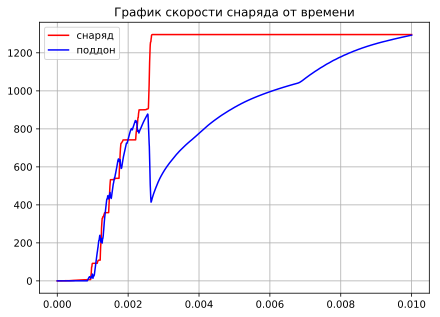

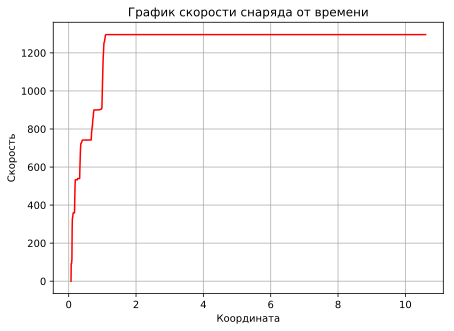

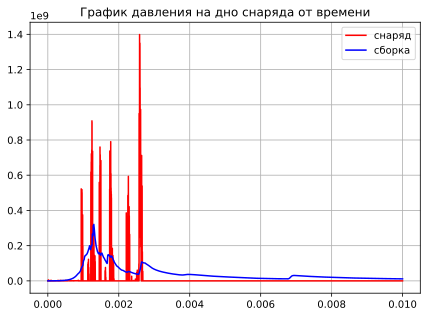

In [16]:
vmax, pmax, layers_all = mainf(wc)

In [17]:
len(layers_all)

651

In [18]:
for i in range(2800, 3300,100):
    lr = layers_all[i][1]
    t = lr.time
    ro, u, e = lr.get_param(lr.q)
    ps = ro
    xs = lr.x_c
    plt.plot(xs, ps)
#plt.ylim(ymin=0)
plt.axvline(x=0.884)
plt.axvline(x=0.884+0.1)
t

IndexError: list index out of range

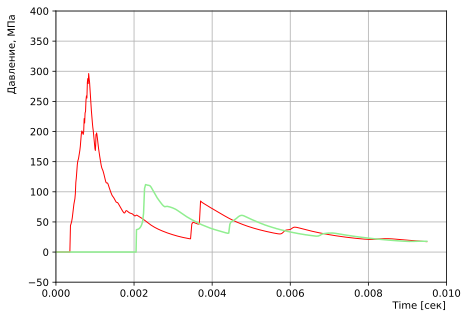

In [19]:
xg1 = 0
xg2 = 0.884
pg1 = []
pg2 = []
ts = []
shift = 0.0005
for lr in layers_all:
    lr = lr[0]
    t = lr.time
    if t < shift:
        continue
    ts.append((t-shift))
    p = interpolate.interp1d(lr.x_c, lr.p, bounds_error=False, fill_value=0)
    pg1.append(float(p(xg1))*1E-6)
    pg2.append(float(p(xg2))*1E-6)


plt.plot(ts, pg1, color='r', linewidth=1)
plt.plot(ts, pg2, color='lightgreen')

ax = plt.gca()
label = ax.set_xlabel('Time [сек]', fontsize = 10)
ax.xaxis.set_label_coords(0.93, -0.07)

label = ax.set_ylabel('Давление, МПа', fontsize = 10)
ax.yaxis.set_label_coords(-0.1, 0.84)

plt.ylim(-50, 400)
plt.xlim(0, 0.01)
plt.grid()
plt.savefig('p_t.png', dpi=300)

### А теперь эксперимент

In [20]:
# 
def get_exper_data(fname):
    ts = []
    ps = []
    with open(fname, 'r') as f:
        for l in f:
            tp = l.strip().replace(',','.').split('\t')
            if len(tp) != 2:
                continue
            t, p = [float(s.strip()) for s in tp]
            
            ts.append(t)
            ps.append(p)
    return np.array(ts), np.array(ps)

In [21]:
ts_kamora, p_kamora = get_exper_data('Камора.lvm')
ts_konus, p_konus = get_exper_data('Конус.lvm')

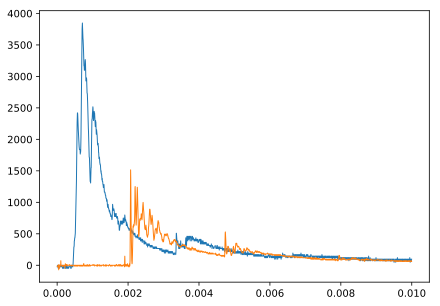

In [22]:
plt.plot(ts_kamora, p_kamora, linewidth=1)
plt.plot(ts_konus, p_konus, linewidth=1)
plt.show()

In [40]:
layers_all[0][0].x_c[0]

-0.1042929788643912

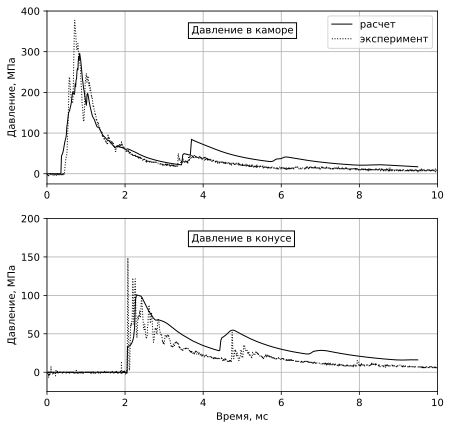

In [44]:
mpl.rcParams['figure.figsize'] = (7,7)
xg1 = 0
xg2 = 0.884
pg1 = []
pg2 = []
ts = []
shift = 0.0005
for lr in layers_all:
    lr = lr[0]
    t = lr.time
    if t < shift:
        continue
    ts.append((t-shift))
    p = interpolate.interp1d(lr.x_c, lr.p, bounds_error=False, fill_value=0)
    pg1.append(float(p(xg1))*1E-6)
    pg2.append(float(p(xg2))*0.9E-6)

ts = np.array(ts)
pg1 = np.array(pg1)
pg2 = np.array(pg2)
    
plt.subplot(211)
plt.plot(ts*1000, pg1, color='black', linewidth=1, ls='-', label='расчет')
plt.plot(ts_kamora*1000, p_kamora*98066.5E-6, color='black', linewidth=1, ls=':', label='эксперимент')

plt.ylim(-25, 400)
plt.xlim(0, 10)
plt.ylabel('Давление, МПа')
plt.legend()
plt.grid()
plt.text(3.7, 345, 'Давление в каморе',
        bbox={'facecolor':'white', 'alpha':1, 'pad':3})

plt.subplot(212)
plt.plot(ts*1000, pg2, color='black', linewidth=1, ls='-')
plt.plot(ts_konus*1000, p_konus*98066.5E-6, color='black', linewidth=1, ls=':')

plt.ylim(-25, 400)
plt.xlim(0, 10)
plt.xlabel('Время, мс')

plt.ylabel('Давление, МПа')


plt.text(3.7, 170, 'Давление в конусе',
        bbox={'facecolor':'white', 'alpha':1, 'pad':3})
plt.ylim(-25, 200)
plt.xlim(0, 10)
plt.grid()
plt.savefig('p_t_2.png', dpi=300)

In [38]:
# SAAVE DATA

np.save('pg1', pg1)
np.save('pg2', pg2)

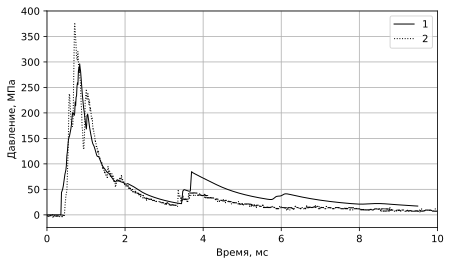

In [33]:
mpl.rcParams['figure.figsize'] = (7,4)
xg1 = 0
xg2 = 0.884
pg1 = []
pg2 = []
ts = []
shift = 0.0005
for lr in layers_all:
    lr = lr[0]
    t = lr.time
    if t < shift:
        continue
    ts.append((t-shift))
    p = interpolate.interp1d(lr.x_c, lr.p, bounds_error=False, fill_value=0)
    pg1.append(float(p(xg1))*1E-6)
    pg2.append(float(p(xg2))*0.9E-6)

ts = np.array(ts)
pg2 = np.array(pg2)
    
plt.plot(ts*1000, pg1, color='black', linewidth=1, ls='-', label='1')
plt.plot(ts_kamora*1000, p_kamora*98066.5E-6, color='black', linewidth=1, ls=':', label='2')

plt.ylim(-25, 400)
plt.xlim(0, 10)
plt.ylabel('Давление, МПа')
plt.legend()
plt.grid()

plt.xlabel('Время, мс')

plt.savefig('Давление в каморе.png', dpi=300)

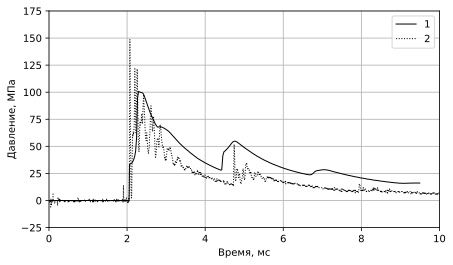

In [36]:
mpl.rcParams['figure.figsize'] = (7,4)
xg1 = 0
xg2 = 0.884
pg1 = []
pg2 = []
ts = []
shift = 0.0005
for lr in layers_all:
    lr = lr[0]
    t = lr.time
    if t < shift:
        continue
    ts.append((t-shift))
    p = interpolate.interp1d(lr.x_c, lr.p, bounds_error=False, fill_value=0)
    pg1.append(float(p(xg1))*1E-6)
    pg2.append(float(p(xg2))*0.9E-6)

ts = np.array(ts)
pg2 = np.array(pg2)


plt.plot(ts*1000, pg2, color='black', linewidth=1, ls='-', label='1')
plt.plot(ts_konus*1000, p_konus*98066.5E-6, color='black', linewidth=1, ls=':', label='2')

plt.ylim(-25, 400)
plt.xlim(0, 10)
plt.xlabel('Время, мс')

plt.ylabel('Давление, МПа')

plt.ylim(-25, 175)
plt.xlim(0, 10)
plt.grid()
plt.legend()
plt.savefig('Давление в конусе.png', dpi=300)

### А теперь поддон по инерции

In [161]:
import json

with open('testy.json', 'r') as f:
    data = json.load(f)
data = list(reversed(data['list']))
len(data)
# 98066,5 кг/см3 -> Па

336

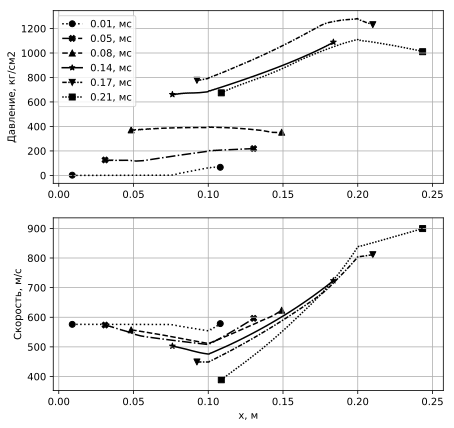

In [261]:
from matplotlib.lines import Line2D
mpl.rcParams['figure.figsize'] = (7,7) 

shift = 0.01
v0 = data[0]['us'][0]
t_shift = shift/v0

styles = [(100, ':', 'o'),(170, '-.', 'X'), (210, '--', '^'),
                  (260, '-', '*'), (285, (0, (3, 1, 1, 1)), 'v'), (307, (0, (1, 1)), 's')]

plt.subplot(211)
legend_elements = []
for i, ls, ms in styles:
    d = data[i]
    x = np.array(d['xs']) - shift
    y = np.array(d['ps'])*1300E-9
    plt.plot(x, y, ls=ls, color='black')
    se = np.array([0,-1])
    plt.scatter(x[se], y[se],color='black',marker=ms)
    
    legend_elements.append(Line2D([0,1], [0,0], label=f"{(d['t']-t_shift)*1000:.2f}, мс", ls=ls, color='black', marker=ms))
        
plt.ylabel('Давление, кг/см2')
    
plt.legend(handles=legend_elements)
plt.grid()
    
plt.subplot(212)
for i, ls, ms in styles:
    d = data[i]
    x = np.array(d['xs']) - shift
    y = np.array(d['us'])
    plt.plot(x, y, ls=ls, color='black')
    se = np.array([0,-1])
    plt.scatter(x[se], y[se],color='black',marker=ms)
# plt.axvline(x=0.1, ls='-',color='black')
# plt.axvline(x=0.2, ls='-',color='black')

plt.xlabel('x, м')
plt.ylabel('Скорость, м/с')

plt.grid()


# plt.axvline(x=0.1, ls='-',color='black')
# plt.axvline(x=0.2, ls='-',color='black')

plt.savefig('Давление и скорости в поршне.png', dpi=300)
plt.show()

In [ ]:
# 4 \ 7
mainf(wc)

In [ ]:
layers, l_max, l_min, l_ignite, x_left01 = get_layers_x_max(wc)
l = layers[1]
l.clone(l)

#### Фитнесс-функция

In [ ]:
%%px --local
def fitness_foo(wchr):
    def shtraf(p):
        p_shtraf = 4200E5
        if p < p_shtraf:
            return 0
        p_max = 7000E5
        v_shtraf = 2000
        k = v_shtraf / (p_max - p_shtraf)
        b = -k * p_shtraf
        return k * p + b

    tp = mainf(wchr, with_calc=True, print_gr=False)
    fitness = -9900
    if isinstance(tp, tuple):
        Vmax, pmax = tp
        fitness = Vmax - shtraf(pmax)
    return fitness


def fit_fun4tst(wc):
    time.sleep(rnd.random())
    return mainf(wc, with_calc=False, print_gr=True)

In [ ]:
fitness_foo(wc)

In [ ]:
%%px --local
wc = {'fitness': None,
 'name': 'Забина',
 'chromo': {'om_1': 0.06775975418500048,
  'om_2': 0.07099813620763305,
  'm_1': 0.10587159948906029,
  'pf_1': 5203778.656607398,
  'delta_powder_1': 766.0104637899715,
  'delta_powder_2': 602.197054404907,
  'powder_type_1': '4\\7',
  'powder_type_2': '6\\7 фл ',
  'p_ign_perc': 0.1343609331458672},
 'id': 0,
 'dop_info': None,
 'vec_param': np.array([ 0.2523614 ,  0.67775707,  0.66055077,  0.5155332 ,  0.59113436,
         0.22710457,  0.04295117]),
 'vec_struct': np.array([ 0.,  2.])}
fitness_foo(wc)

In [ ]:
def fit_func(wchromo):
    return wchromo, fitness_foo(wchromo)  #fit_fun4tst
#     return wchromo, fit_fun4tst(wchromo)

def ff_4clustycalc(wchromo):
#     print(f"{wchomo['name']}")
    return lbv.apply_async(fit_func, wchromo)

In [ ]:
import json
from opti.Generation import op_lst_to_dict
def add_result(res):
    try:
        fit, op = res
        if fit < 2400:
            return
        with open(f"jsons_pbu\\{int(fit)}_{op.name}.json", 'w') as openfile:
            json.dump(op.to_str(), openfile)
    except Exception as e:
        print(f"error save {e}")

In [ ]:
from rx.concurrency import CurrentThreadScheduler, ThreadPoolScheduler
from rx.subjects import Subject
from rx import Observable
from threading import Lock

from opti.SwarmNet import SwarmNet

mutex = Lock()
curr_tr_sched = CurrentThreadScheduler()
thr_pool_sched = ThreadPoolScheduler(len(cl[:]))

sub_new_jobs = Subject()
sub_done_jobs = Subject()
sub_freeworkers = Subject()
n_workers = len(cl[:])

def job_done(res):
    try:
        gp.on_next4sub_take_calced(res)
        sub_done_jobs.on_next(res)
    except Exception as e:
        print(f"error job done {e}")
    
def on_next_njob_map(wchr):
    res = ff_4clustycalc(wchr)
    return res

disposer4 = gp.sub_update_pop.subscribe(on_next=add_result, on_error=lambda e: print(f"disp4 {e}"))
disposer5 = sub_done_jobs\
    .buffer_with_count(100)\
    .map(lambda l: 100)\
    .scan(lambda x,y: x+y)\
    .subscribe(on_next=lambda x: print(f"Посчитано {x} вариантов"))

def dist_on_error(e):
    !telegram-send f"Error in 6 {e}"
    
def flat_map_fun(ar2):
    res = ar2.result()
    wchr = gp.get_new_wcr()
    sub_new_jobs.on_next(wchr)
    return res
    
    
disposer6 = sub_new_jobs\
    .map(on_next_njob_map)\
    .flat_map(lambda ar: Observable.just(ar).observe_on(thr_pool_sched).map(flat_map_fun))\
    .filter(lambda r: isinstance(r, tuple))\
    .retry(33)\
    .subscribe(on_next=job_done, on_error=dist_on_error)

disposers = [disposer5,disposer6,disposer4]

def stop():
    for d in disposers:
        d.dispose()
    lbv.abort()
    
def start(n=None):
    if not n:
        n = len(cl[:])
    for i in range(n):
        wchr = gp.get_new_wcr()
        sub_new_jobs.on_next(wchr)

In [ ]:
start()

In [ ]:
stop()

In [ ]:
gp.fit_threshold = 600

In [ ]:
op_b = gp.bests[-1][-1]
wc_b = op_b.get_best()
wc_b

In [ ]:
def save_op(op, folder='jsons_pbu'):
    try:
        fit = op.best_fitness
        fn = folder+f"\\{int(fit)}_{op.name}.json"
        with open(fn, 'w') as openfile:
            json.dump(op.to_str(), openfile)
        print(f'Saved {fn}')
    except Exception as e:
        print(f"error save {e}")

In [ ]:
# save_bests = gp.bests
# gp = GenerationP(cc,n_max)
# gp.bests = save_bests
gp.prob_cross = 0.33
gp.prob_mut = 0.95
gp.fit_threshold = 1500


In [ ]:
gp.prob_mut_gene = 0.2

In [ ]:
def improve(tp):
    print(tp)
    !telegram-send f"improve {tp}"
disp33 = gp.sub_update_best_op.map(lambda res: (res[0], res[1].name)).subscribe(improve)

In [ ]:
disp33.dispose()

In [ ]:
disp11 = gp.sub_update_pop.map(lambda res: (res[0], res[1].name)).subscribe(print)


In [ ]:
disp11.dispose()

In [ ]:
disp22 = sub_done_jobs.map(lambda r: (r[0]['name'], r[1])).subscribe(lambda tp: print(f"allz {tp}"))

In [ ]:
disp22.dispose()

In [ ]:
op_b = gp.bests[-1][-1]
op_b = OptiPerson(cc, op_b.get_best_chromo(),fitness=op_b.best_fitness)

In [ ]:
from rx.concurrency import CurrentThreadScheduler, ThreadPoolScheduler
from rx.subjects import Subject
from rx import Observable
from threading import Lock

from opti.SwarmNet import SwarmNet

mutex = Lock()
curr_tr_sched = CurrentThreadScheduler()
thr_pool_sched = ThreadPoolScheduler(len(cl[:]))

sub_new_jobs = Subject()
sub_done_jobs = Subject()
sub_freeworkers = Subject()
sub_improve = Subject()
n_workers = len(cl[:])

ddx = 0.0025
swn = SwarmNet(op_b, dx=ddx)

def job_done(res):
    try:
        if swn.take_calced_wchr_thread_save(*res):
            sub_improve.on_next(res[1])
            if swn.is_extremum():
                !telegram-send f"Extremum fit = {res[1]}, dx = {ddx}"
                sub_new_jobs.on_completed()
                return
        sub_done_jobs.on_next(res)
    except Exception as e:
        print(f"error job done {e}")
    
def on_next_njob_map(wchr):
    res = ff_4clustycalc(wchr)
    return res

# disposer4 = gp.sub_update_pop.subscribe(on_next=add_result, on_error=lambda e: print(f"disp4 {e}"))
disposer5 = sub_done_jobs\
    .buffer_with_count(100)\
    .map(lambda l: 100)\
    .scan(lambda x,y: x+y)\
    .subscribe(on_next=lambda x: print(f"Посчитано {x} вариантов"))

def dist_on_error(e):
    !telegram-send f"Error in 6 {e}"
    
def flat_map_fun(ar2):
    res = ar2.result()
    wchr = swn.get_wchr_4calc_thread_save()
    sub_new_jobs.on_next(wchr)
    return res
    
    
disposer6 = sub_new_jobs\
    .map(on_next_njob_map)\
    .flat_map(lambda ar: Observable.just(ar).observe_on(thr_pool_sched).map(flat_map_fun))\
    .filter(lambda r: isinstance(r, tuple))\
    .retry(33)\
    .subscribe(on_next=job_done, on_error=dist_on_error)

disposers = [disposer5,disposer6]#,disposer4]

def stop():
    for d in disposers:
        d.dispose()
    lbv.abort()
    
def start(n=None):
    if not n:
        n = len(cl[:])
    for i in range(n):
        wchr = swn.get_wchr_4calc_thread_save()
        sub_new_jobs.on_next(wchr)

In [ ]:
start()

In [ ]:
stop()

In [ ]:
disp111 = sub_improve.subscribe(print)

In [ ]:
disp111.dispose()

In [ ]:
swn.is_extremum()

In [ ]:
# reload
op_b = OptiPerson(cc, swn.get_best_cromo(), swn.fit_max)

In [ ]:
save_op(op_b)

In [ ]:
mainf(op_b.get_best())

In [ ]:
op_b.get_best_chromo()

In [ ]:
swn.all_dict